In [29]:
#ezdxf: biblioteca utilizada para trabalhar com arquivoss .dxf
pip install ezdxf matplotlib


[notice] A new release of pip is available: 23.1.2 -> 23.2.1
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [30]:
import ezdxf
from ezdxf.layouts import Paperspace

import matplotlib.pyplot as plt
from ezdxf.addons.drawing.properties import LayoutProperties
from ezdxf.addons.drawing import RenderContext, Frontend
from ezdxf.addons.drawing.matplotlib import MatplotlibBackend

In [31]:
#lendo o arquivo
doc = ezdxf.readfile("doc.dxf")
msp = doc.modelspace()

# Printando uma imagem a partid das informacoes do .dxf

findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not

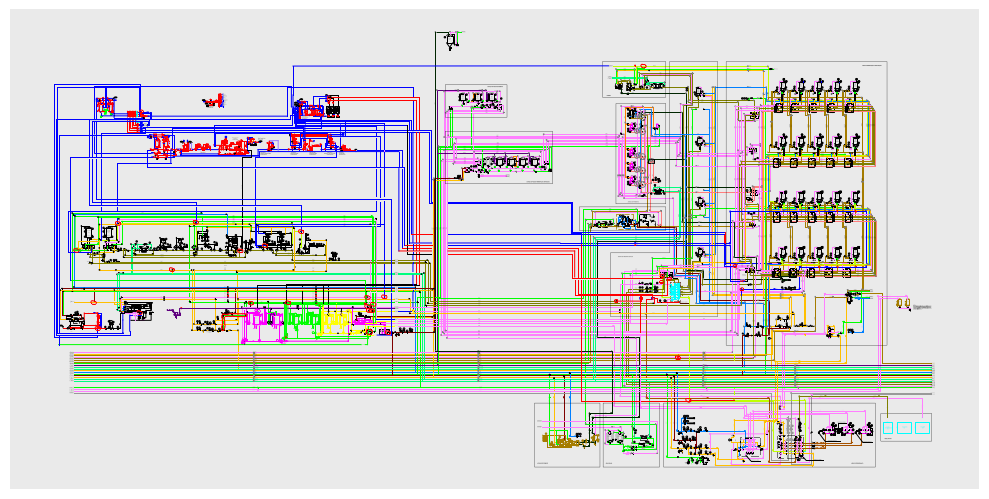

In [32]:
#plotando a figura com matplotlib
fig: plt.Figure = plt.figure()
ax: plt.Axes = fig.add_axes((0, 0, 1, 1))
ctx = RenderContext(doc)

# get the modelspace properties
msp_properties = LayoutProperties.from_layout(msp)
# set light gray background color and black foreground color
msp_properties.set_colors("#eaeaea")
out = MatplotlibBackend(ax)
# override the layout properties and render the modelspace
Frontend(ctx, out).draw_layout(msp, finalize=True, layout_properties=msp_properties)

fig.savefig("image.png")

# Identificando e Printando cada layer do .dxf

In [33]:
#função que exclui todas as layers e entidades diferentes da escolhida
def exclude_layer_and_entities(n_doc, n_msp, layer_name):
    entities_to_remove = []
    for entity in n_msp:
        if entity.dxf.layer != layer_name:
            entities_to_remove.append(entity)
    
    # Remove entities from modelspace
    for entity in entities_to_remove:
        n_msp.delete_entity(entity)

In [34]:
#identificando o nome de todas as layers
layers = []
for layer in doc.layers:
    layers.append(layer.dxf.name)

In [35]:
def generate_image(n_doc, n_msp, n_layer_name):
  # Matplotlib rendering setup
  fig: plt.Figure = plt.figure()
  ax: plt.Axes = fig.add_axes((0, 0, 1, 1))

  # Create a rendering context
  ctx = RenderContext(n_doc)

  # Get the modelspace properties
  msp_properties = LayoutProperties.from_layout(n_msp)
  msp_properties.set_colors("#eaeaea")

  # Create a Matplotlib backend
  out = MatplotlibBackend(ax)

  # Render the modelspace with labels
  Frontend(ctx, out).draw_layout(n_msp, finalize=True, layout_properties=msp_properties)#,  #filter_func=my_filter)

  # Save the figure as an image
  fig.savefig("./image_test/"+n_layer_name+".png")

findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not found.
findfont: Font family 'RomanS' not

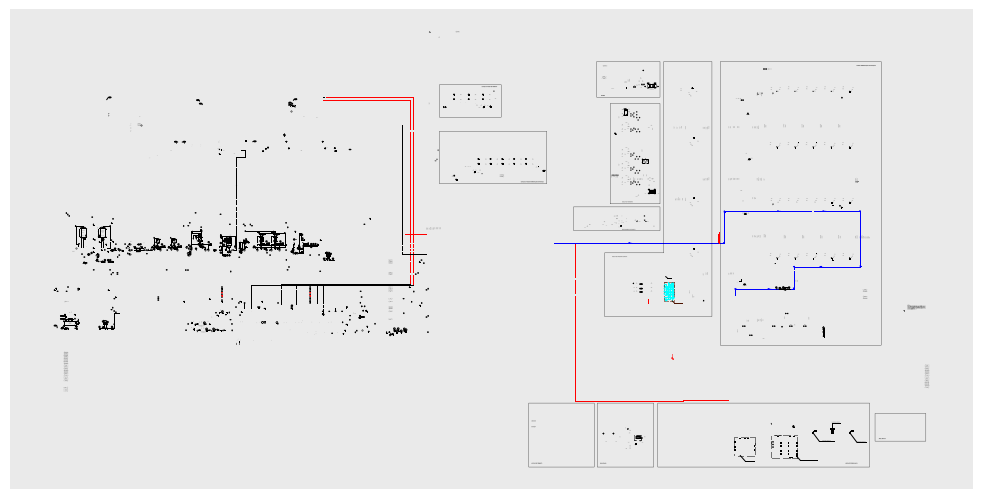

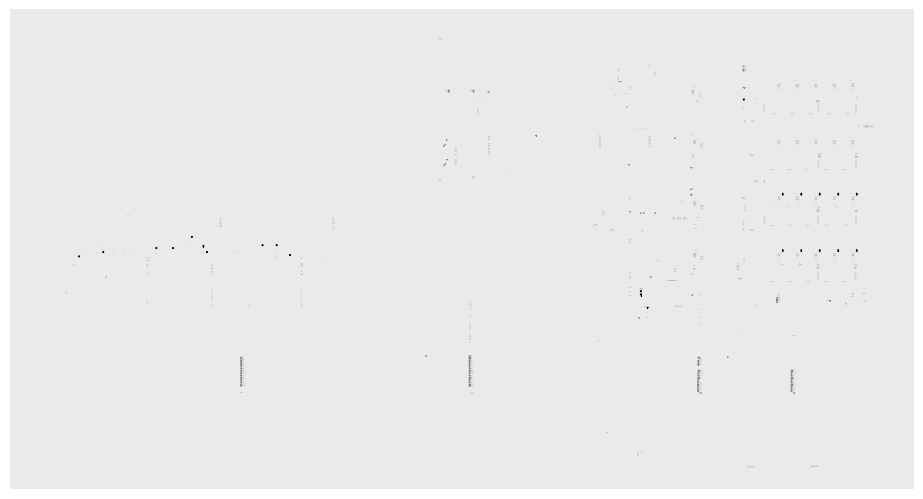

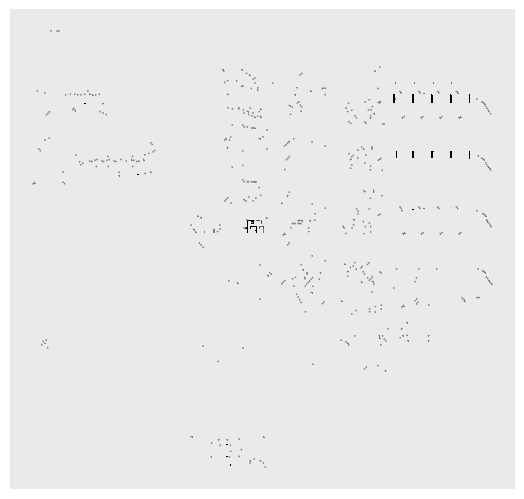

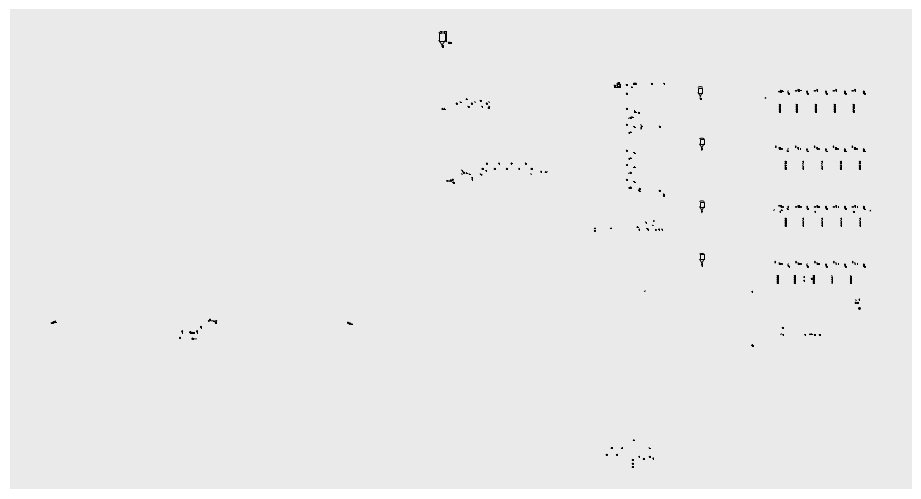

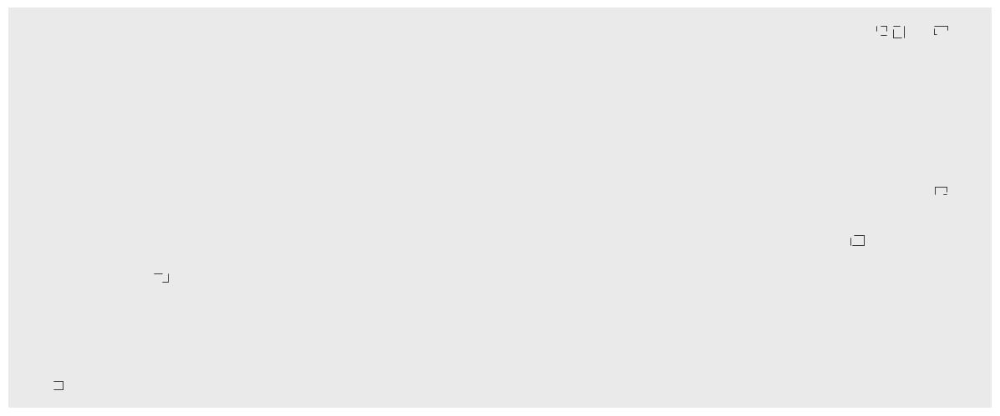

...

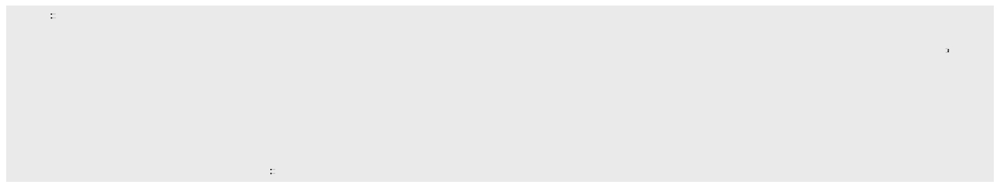

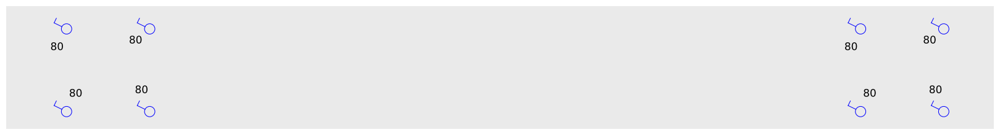

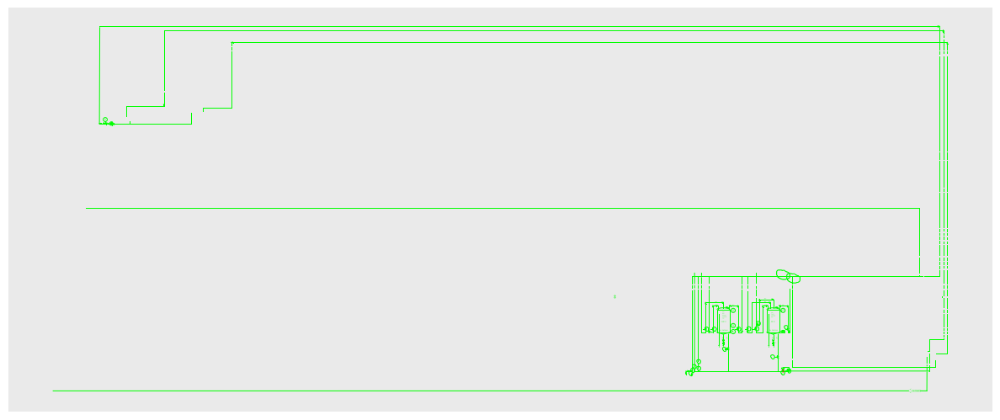

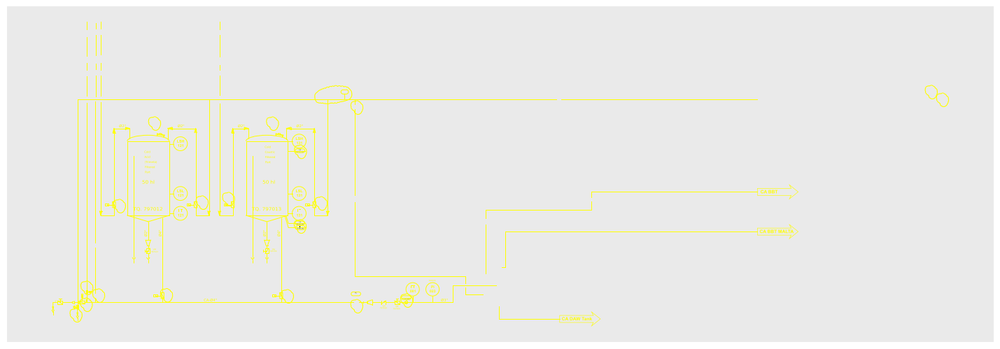

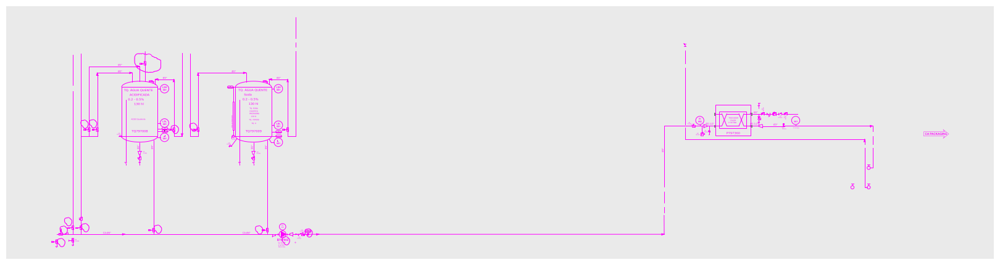

In [39]:
#Para cada iteração o arquivo dxf é lido novamente para então apagar tudo menos a layer indicada, para então printar ela em específico
for layer in layers:

  new_doc = ezdxf.readfile("doc.dxf")
  new_msp = new_doc.modelspace()

  exclude_layer_and_entities(new_doc, new_msp, layer)

  generate_image(new_doc, new_msp, layer)
  

# Identificando e Printando os blocos

In [54]:
def generate_block_image(n_doc, n_msp, n_block_name):
  # Matplotlib rendering setup
  fig: plt.Figure = plt.figure()
  ax: plt.Axes = fig.add_axes((0, 0, 1, 1))

  # Create a rendering context
  ctx = RenderContext(n_doc)

  # Get the modelspace properties
  msp_properties = LayoutProperties.from_layout(n_msp)
  msp_properties.set_colors("#eaeaea")

  # Create a Matplotlib backend
  out = MatplotlibBackend(ax)

  # Render the modelspace with labels
  Frontend(ctx, out).draw_layout(n_msp, finalize=True, layout_properties=msp_properties)#,  #filter_func=my_filter)

  # Save the figure as an image
  fig.savefig("./image_block/"+n_block_name+".png")

In [63]:

blocks = list(doc.blocks)
for block in blocks:
    if (block.name == "*Model_Space" or block.name == "*Paper_Space"):
        blocks.remove(block)
blocks.remove(blocks[0])
for block in blocks:
    print(block.name)

KI8
YI9
E2E
OF_430
DRENO
vpr1
A3A
A6A
vap
SYM44
SYM49
SYM26
60
spray ball dn1
FLUXO
PDP-431001
she
A$C7AF47353
ESPIRAL
redução
FIL
MANIFOLDE CERVEJA
svb
shd
re2
vpr
ve1
svc
vg
re1
re3
vap1
vr1
PURGADOR
VISOR
D8D
VALMASONEILAN
RICHTUNG_R
P_Kreiselpumpe
M_MSR Vorort
M_MSR Steuerung
E_Motor
V_Scheibenventil Kolben FS
V_Scheibenventil manuell
V_Rückschlagklappe
V_Anschluß Zwischenflanschen für DG-Ventil
L_Gully
L_Nennweite
A_Propellerrührwerk
A_Sprühkugel klein
P_Schlauchpumpe
*U51
V_Venturidüse
Z_MEDIUMTEXT_KURZ
*U54
V_Scheibenventil_FS_ZWFL
V_Scheibenventil_MAN_ZWFL
V_Rückschlagklappe_ZW
M_IDM_1
M_Inlinegehäuse
M_Inlineschauglas beleuchtet
L_Reduzierung konzentrisch
V_Anschluß Flansch Druckminderer AUS
V_Anschluß Flansch  Druckminderer EIN
V_Anschluß Flansch Ventil
V_Druckminderventil DG allgemein
M_Manometer
V_Sicherheitsventil Eck federbetätigt
M_Schwebekörper-Durchflussmesser
L_Flanschverbindung komplett
M_Inlineschauglas
A_Injektor
V_Sitz-Regelventil DG Membran FS
V_Sitz-Asperrventil

findfont: Font family 'Simplex' not found.
findfont: Font family 'Simplex' not found.
findfont: Font family 'Simplex' not found.
findfont: Font family 'Simplex' not found.
findfont: Font family 'Simplex' not found.
/var/folders/wb/q6mmtt0x025274xbq5yvv5d00000gn/T/ipykernel_3083/886988472.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig: plt.Figure = plt.figure()
findfont: Font family 'Txt' not found.
findfont: Font family 'Txt' not found.
findfont: Font family 'Txt' not found.
findfont: Font family 'Txt' not found.
findfont: Font family 'Txt' not found.
findfont: Font family 'Txt' not found.
findfont: Font family 'Txt' not found.
findfont: Font family 'Txt' not found.
findfont: Font family 'Txt' not found.
findfont

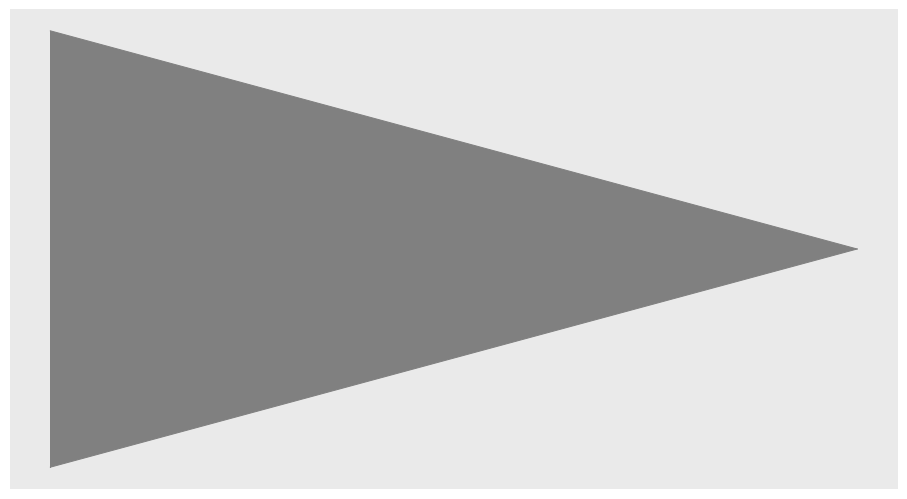

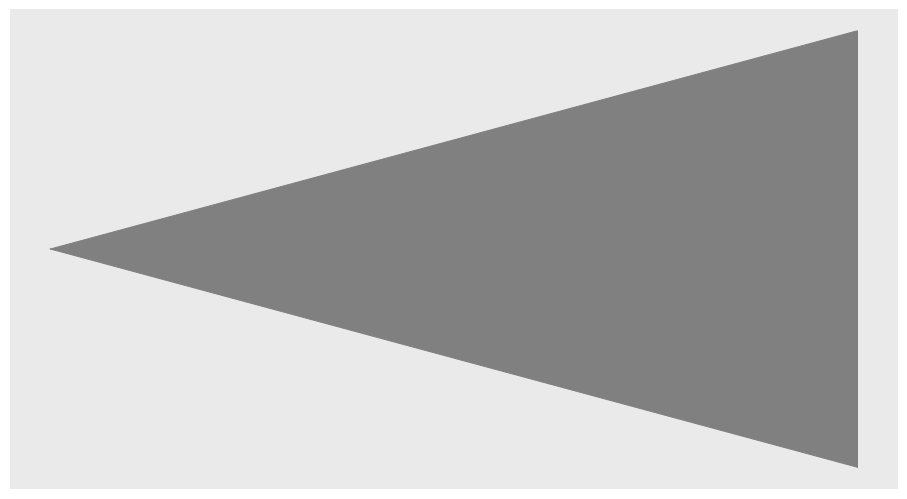

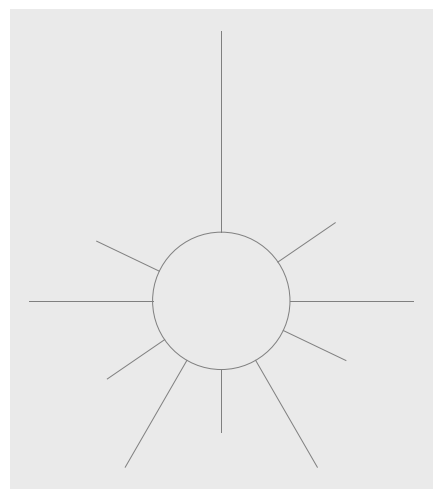

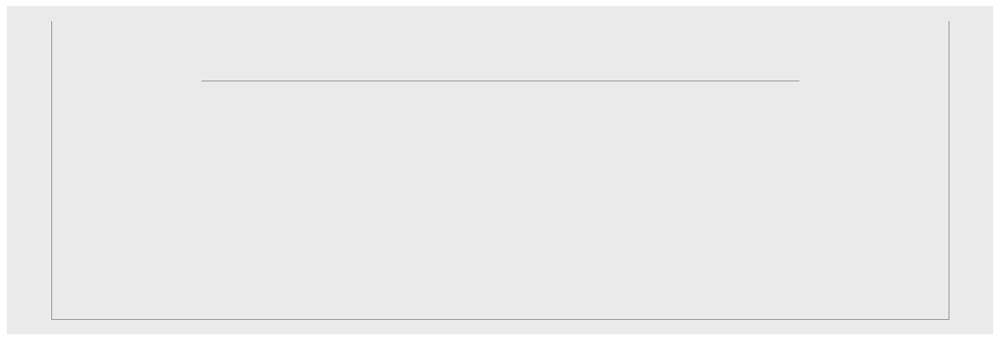

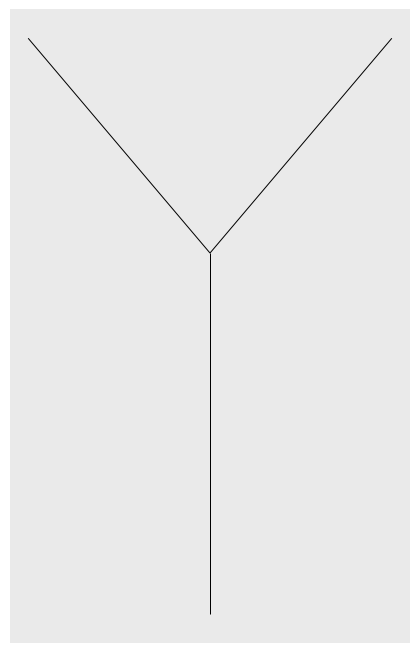

...

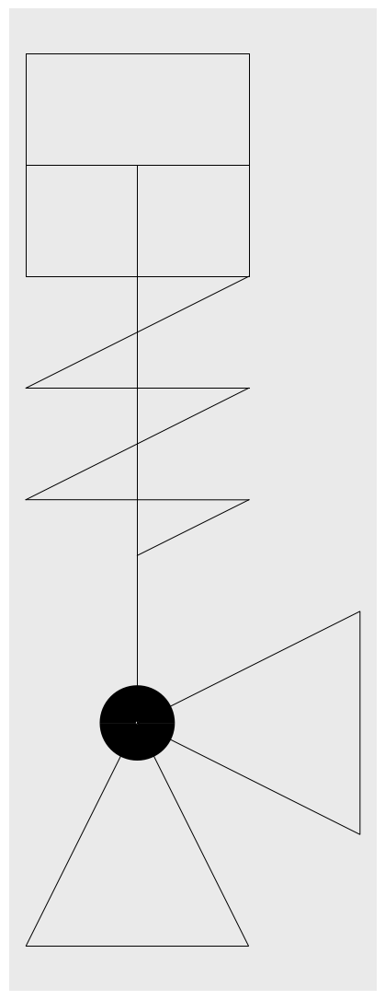

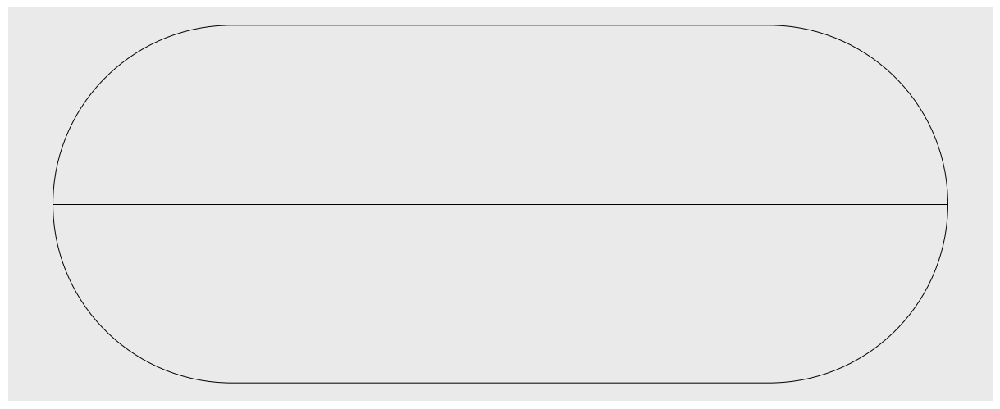

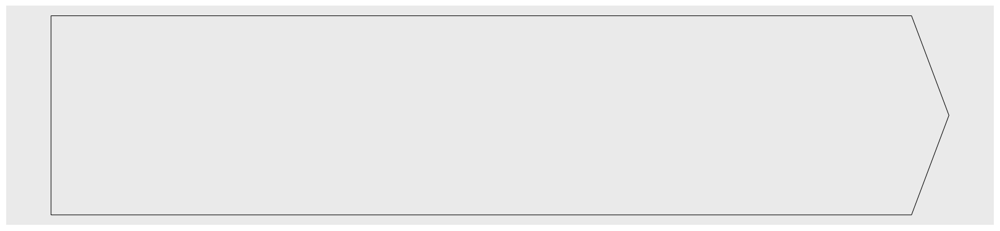

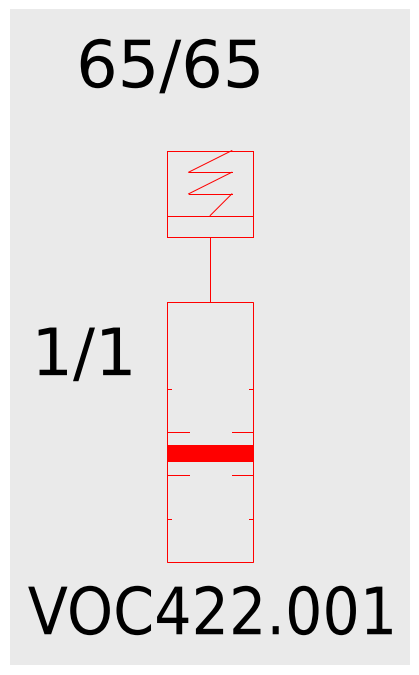

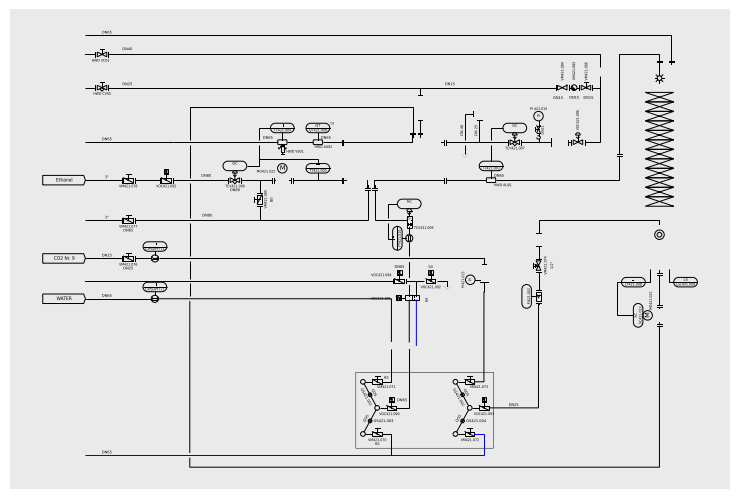

In [76]:
from ezdxf.addons import Importer

for block in blocks:
    new_doc = ezdxf.new()

    importer = Importer(doc, new_doc)
    importer.import_block(block.name)
    importer.finalize()

    new_msp = new_doc.modelspace()

    new_msp.add_blockref(
        name=block.name,  # Name of the block definition
        insert=(0, 0),        # Insertion point
        dxfattribs={},        # Additional DXF attributes (optional)
    )

    generate_block_image(new_doc, new_msp, block.name)


